In [1]:
import pandas as pd
import csv
import numpy
import random
import os
import numpy as np
import warnings
import math
import plotly.express as px
import plotly.graph_objects as go
from docx.shared import Inches
from docx import Document
warnings.filterwarnings('ignore')

In [2]:
#STOCKS

In [3]:
def get_stats(security,year,quarter):
    data = pd.read_csv('Assignment 1/q'+str(quarter)+'_'+str(year)+'_all.csv')
    data.dropna(inplace=True)
    stocks = security

    df = data[data['Ticker'].isin(stocks)]
    df.reset_index(inplace=True)
    df.drop(['index'],axis=1,inplace=True)
    df.sort_values(by='Date',inplace=True)
    df.reset_index(inplace=True)
    df.drop(['index'],axis=1,inplace=True)
    

    df['Trades'] = (df['LitTrades'] + df['TradesForHidden'])
    df['TradeVol'] = (df["LitVol('000)"] + df["TradeVolForHidden('000)"])
    df['Cancel_to_Trade'] = df['Cancels']/df['Trades']#check
    df['Trade_to_Order'] = df['TradeVol']*100/(df["OrderVol('000)"])
    df['Hidden_Rate'] = df['Hidden']*100/df['Trades']
    df['Hidden_Vol'] = df["HiddenVol('000)"]*100/df['TradeVol']
    df['Oddlot_Rate'] = df['OddLots']*100/df['Trades']
    df['Oddlot_Vol'] = df["OddLotVol('000)"]*100/df['TradeVol']
    #df.replace([np.inf,-np.inf],np.nan)
    #df.dropna(inplace=True)

    

    columns_of_interest = ['Cancel_to_Trade', 'Trade_to_Order', 'Hidden_Rate', 'Hidden_Vol', 'Oddlot_Rate', 'Oddlot_Vol']
    stats = {}
    for column in columns_of_interest:
        stats[column] = {
            'Mean': 0,
            'p25': 0,
            'p50': 0,
            'p75': 0,
            'SD': 0
        }
    num = 0
    for stock in stocks:
        df_stock = df[df['Ticker']==stock]
        num+=1
    
        for column in columns_of_interest:
            if pd.isna(df_stock[column].mean()) or pd.isna(df_stock[column].quantile(0.25)) or pd.isna(df_stock[column].quantile(0.50)) or pd.isna(df_stock[column].quantile(0.75)) or pd.isna(df_stock[column].std()):
                continue
            stats[column]['Mean']+=df_stock[column].mean()
            stats[column]['p25']+=df_stock[column].quantile(0.25)
            stats[column]['p50']+=df_stock[column].quantile(0.50)
            stats[column]['p75']+=df_stock[column].quantile(0.75)
            stats[column]['SD']+=df_stock[column].std()

    for column in columns_of_interest:
        stats[column]['Mean']=stats[column]['Mean']/num
        stats[column]['p25']=stats[column]['p25']/num
        stats[column]['p50']=stats[column]['p50']/num
        stats[column]['p75']=stats[column]['p75']/num
        stats[column]['SD']=stats[column]['SD']/num
    
    stats = pd.DataFrame(stats).T
    stock_stats = stats
    return stock_stats

In [4]:
def plot(stocks,ETFs):

    doc_path = r"Plots2.docx"
    doc = Document()
    doc.save(doc_path)
    image_save_path = 'Images/'
    
    X1 = []
    X2 = []
    descriptive = ["Mean", "p25", "p50", "p75", "SD"]
    metrics = ["Cancel_to_Trade", "Trade_to_Order", "Hidden_Rate", "Hidden_Vol", "Oddlot_Rate", "Oddlot_Vol"]
    columns1 = {}
    for i in descriptive:
        for j in metrics:
            columns1[j+'_'+i]=[]
    for year in range(2012,2025):
        for quarter in range(1,5):
            stri = 'Assignment 1/q'+str(quarter)+'_'+str(year)+'_all.csv'
            if os.path.exists(stri):
                X1.append(year*10000+(quarter*3-2)*100+1)
                stat = get_stats(stocks,year,quarter)
                for i in descriptive:
                    for j in metrics:
                        columns1[j+'_'+i].append(abs(stat[i][j]))
    print('Stocks Done')
    for j in metrics:
        fig = go.Figure()
        for i in descriptive:
            fig.add_trace(go.Scatter(x=X1, y=columns1[j+'_'+i], mode='lines', name=i+' (Stocks)'))
        fig.update_layout(title=j+' Over Time', xaxis_title='Date', yaxis_title=j, width=800, height=600)
        fig.show()
        image_path = image_save_path+'Stocks_'+j+'.png'
        fig.write_image(image_path)
        doc.add_heading(j+'_'+i, level=1)
        doc.add_picture(image_path, width=Inches(6))
        doc.add_paragraph()


    
    columns2 = {}
    for i in descriptive:
        for j in metrics:
            columns2[j+'_'+i]=[]
    for year in range(2012,2025):
        for quarter in range(1,5):
            stri = 'Assignment 1/q'+str(quarter)+'_'+str(year)+'_all.csv'
            if os.path.exists(stri):
                X2.append(year*10000+(quarter*3-2)*100+1)
                stat = get_stats(ETFs,year,quarter)
                for i in descriptive:
                    for j in metrics:
                        columns2[j+'_'+i].append(abs(stat[i][j]))

    print('ETFs Done')
    for j in metrics:
        fig = go.Figure()
        for i in descriptive:
            fig.add_trace(go.Scatter(x=X1, y=columns2[j+'_'+i], mode='lines', name=i+' (ETFs)'))
        fig.update_layout(title=j+' Over Time', xaxis_title='Date', yaxis_title=j, width=800, height=600)
        fig.show()
        image_path = image_save_path+'ETFs_'+j+'.png'
        fig.write_image(image_path)
        doc.add_heading(j+'_'+i, level=1)
        doc.add_picture(image_path, width=Inches(6))
        doc.add_paragraph()
    for j in metrics:
        for i in descriptive:
            fig = go.Figure()
            fig.add_trace(go.Scatter(x=X1, y=columns1[j+'_'+i], mode='lines', name=j+' (Stocks)'))
            fig.add_trace(go.Scatter(x=X2, y=columns2[j+'_'+i], mode='lines', name=j+' (ETFs)'))
            fig.update_layout(title=j+' Over Time', xaxis_title='Date', yaxis_title=i, width=800, height=600)
            fig.show()
            image_path = image_save_path+'Comparison_'+j+'.png'
            fig.write_image(image_path)
            doc.add_heading(j+'_'+i, level=1)
            doc.add_picture(image_path, width=Inches(6))
            doc.add_paragraph()

    doc.save(doc_path)
    print(f"Document saved as {doc_path}")

In [5]:
stocks = ['COOL', 'ELMD', 'TREX', 'WCC', 'CBNK', 'TRS', 'MPR', 'MLI', 'SFY', 'EXC', 'BSRR', 'POOL', 'LACO', 'FUNC', 'MCRS', 'HWG', 'TTWO', 'CAVM', 'WRB', 'TPX', 'FNB', 'OBAF', 'AJG', 'SNTA', 'JOY', 'PSTI', 'IHC', 'AQQ', 'BELFA', 'TSBK', 'MACK', 'AOL', 'AFCB', 'PACB', 'HNT', 'TSYS', 'BZH', 'NTIC', 'BANC', 'CZFC', 'SNPS', 'TWI', 'AATI', 'AXK', 'FIS', 'SMTX', 'WWIN', 'T', 'SYKE', 'ESSA', 'WBC', 'CCGM', 'VPG', 'AMCC', 'ITIC', 'CRBC', 'ALCO', 'POL', 'JDAS', 'LPH', 'EW', 'STEL', 'CSCD', 'ABVA', 'LLY', 'NKTR', 'RXN', 'CENX', 'RMCF', 'BBT', 'FBSS', 'SAPX', 'PEG', 'DVR', 'NWLI', 'CCXI', 'NFSB', 'OMER', 'NBN', 'UNB', 'GALE', 'ADP', 'CTAS', 'CSS', 'IPT', 'DDD', 'NRIM', 'DSTI', 'PKD', 'KEQU', 'SUBK', 'SCX', 'FCS', 'GEF.B', 'SWK', 'BFLY', 'TMP', 'ABVT', 'LAWS', 'SCL']
ETFs = ['DOG', 'UINF', 'RTL', 'JKJ', 'GREK', 'TZD', 'AXID', 'ACWI', 'EDZ', 'AOA', 'EWC', 'PHO', 'XLI', 'AGZ', 'FXI', 'PBE', 'PLK', 'ENZL', 'FLG', 'CHIX', 'EIDO', 'VWO', 'BKLN', 'VGK', 'PBP', 'IWF', 'PRF', 'EWM', 'GRI', 'SCIF', 'IPS', 'EQL', 'IJR', 'DEM', 'BSCF', 'IYT', 'ITR', 'DXD', 'GMM', 'IPW', 'ELD', 'CMBS', 'IEV', 'PIN', 'SCPB', 'QGEM', 'EPS', 'PDP', 'RGI', 'PRFZ', 'FEP', 'WFVK', 'PSCF', 'GLD', 'SMB', 'AGEM', 'EFAV', 'SLBT', 'QLT', 'SEF', 'GRES', 'GDX', 'RSW', 'CYB', 'ULE', 'UBR', 'LBTA', 'PERM', 'IGM', 'FXG', 'IEI', 'SST', 'TLO', 'EPP', 'ICF', 'UXI', 'SJF', 'STPZ', 'FOS', 'EES', 'KBWB', 'FAS', 'JKH', 'AXSL', 'INSD', 'IYE', 'FXM', 'EDC', 'UUP', 'CORP', 'MUAE', 'REZ', 'VCLT', 'JKG', 'BSCJ', 'ITA', 'BRIL', 'PALL', 'SPLV', 'TWM']

Stocks Done


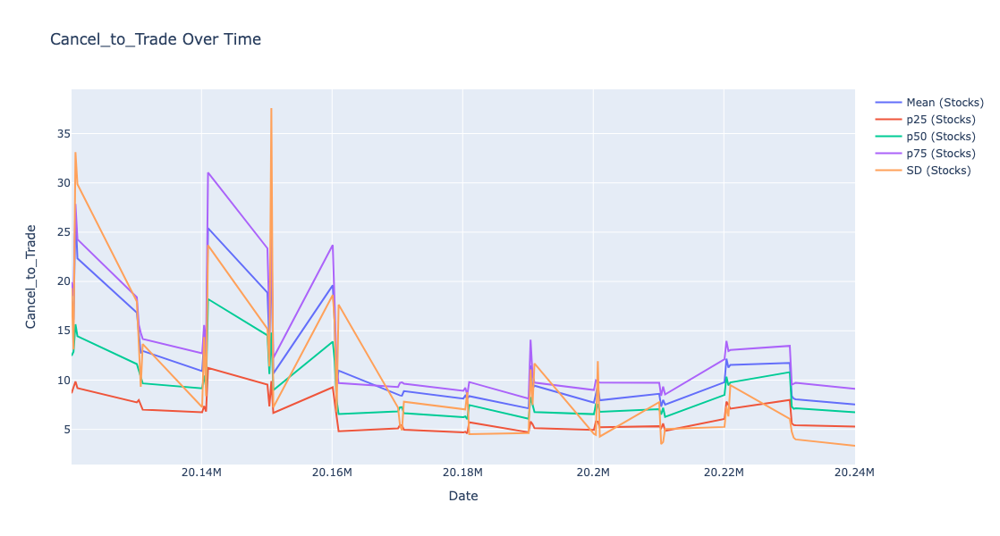

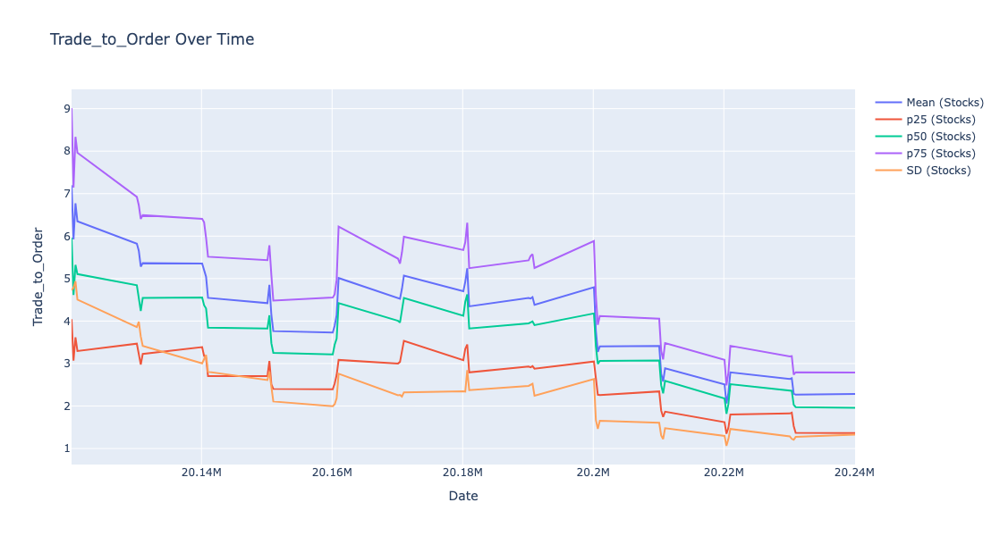

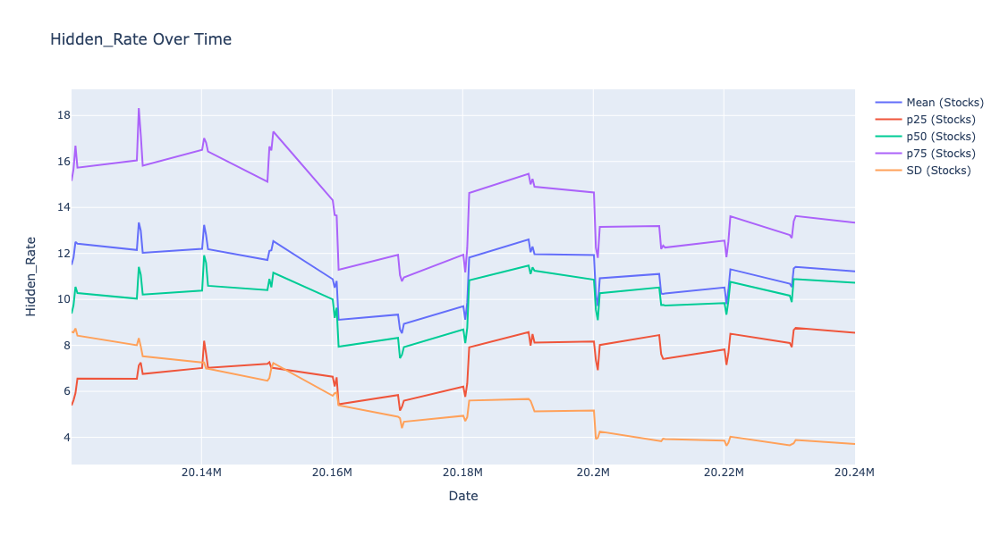

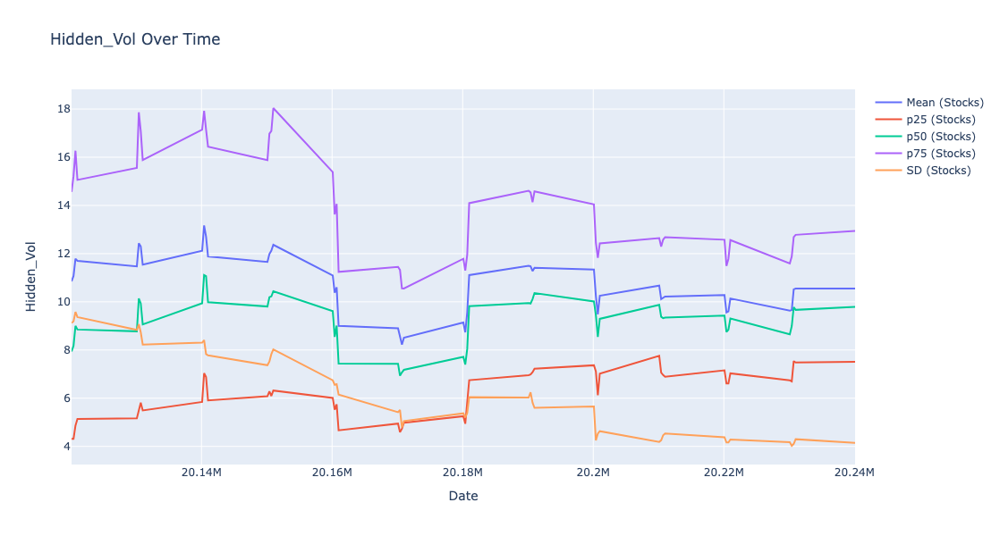

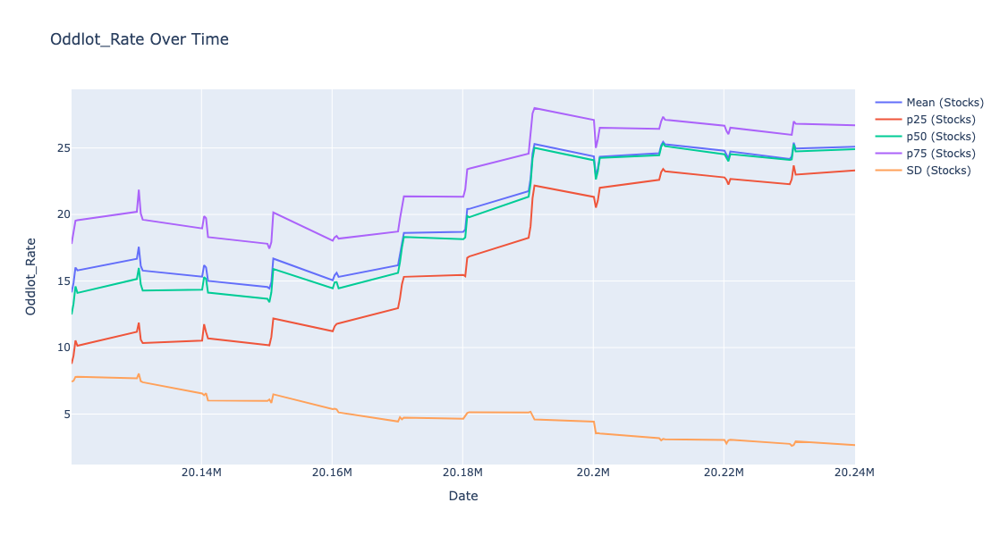

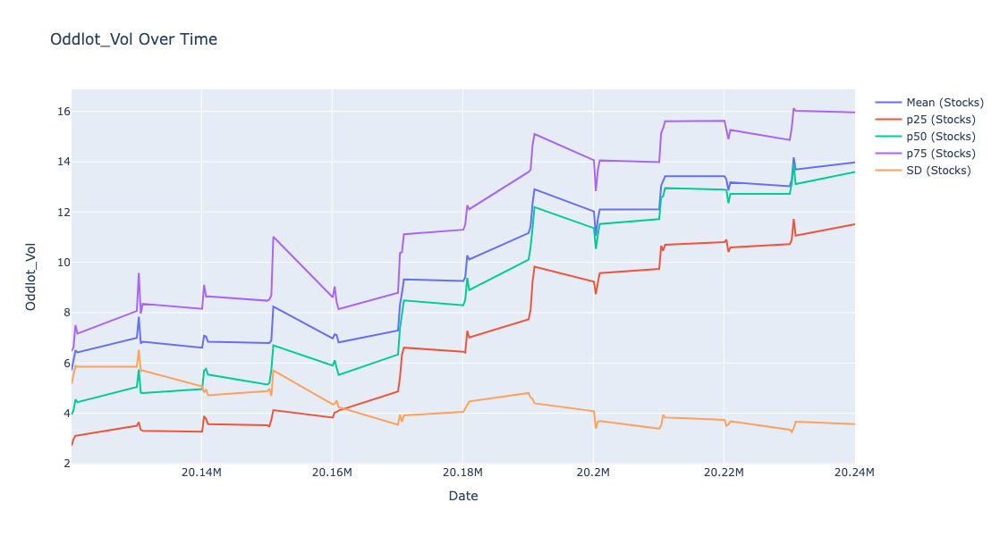

ETFs Done


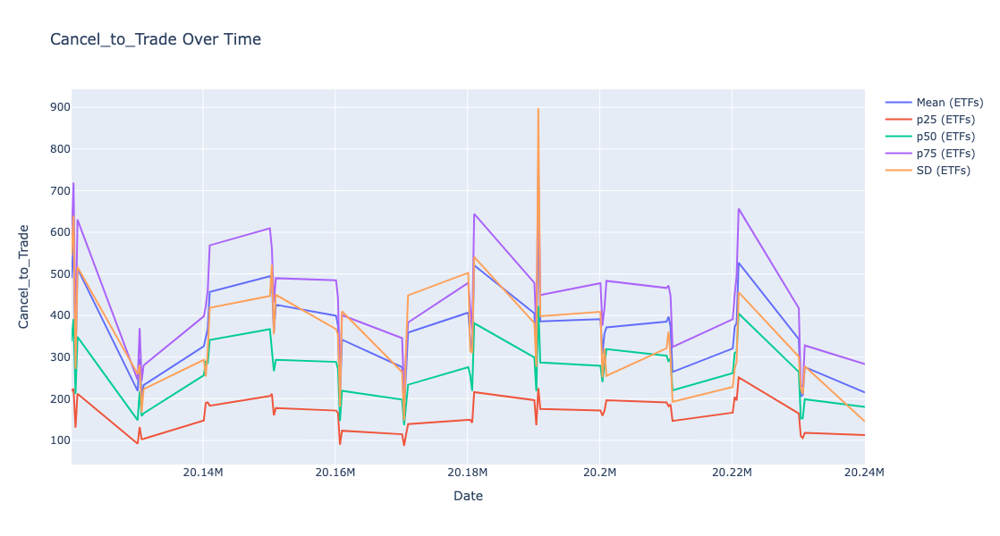

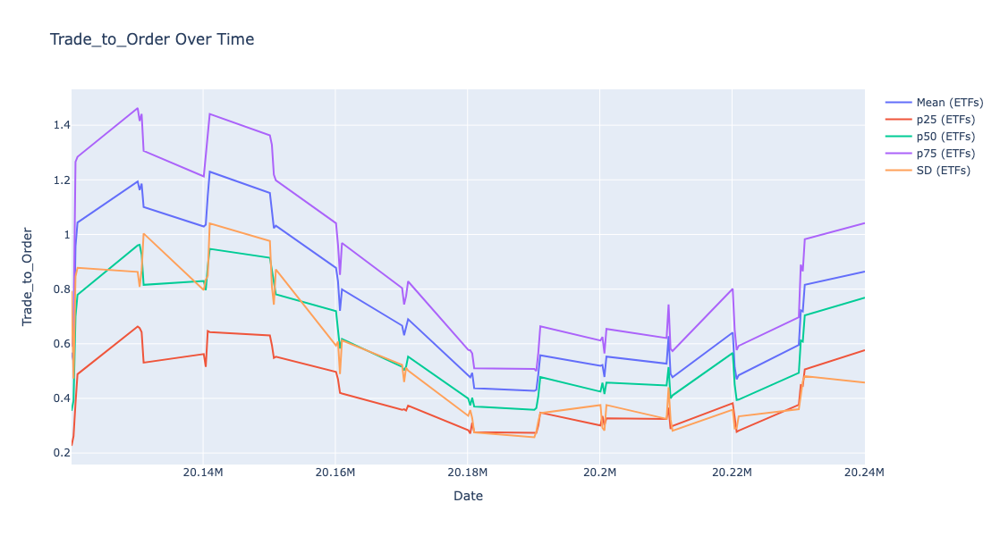

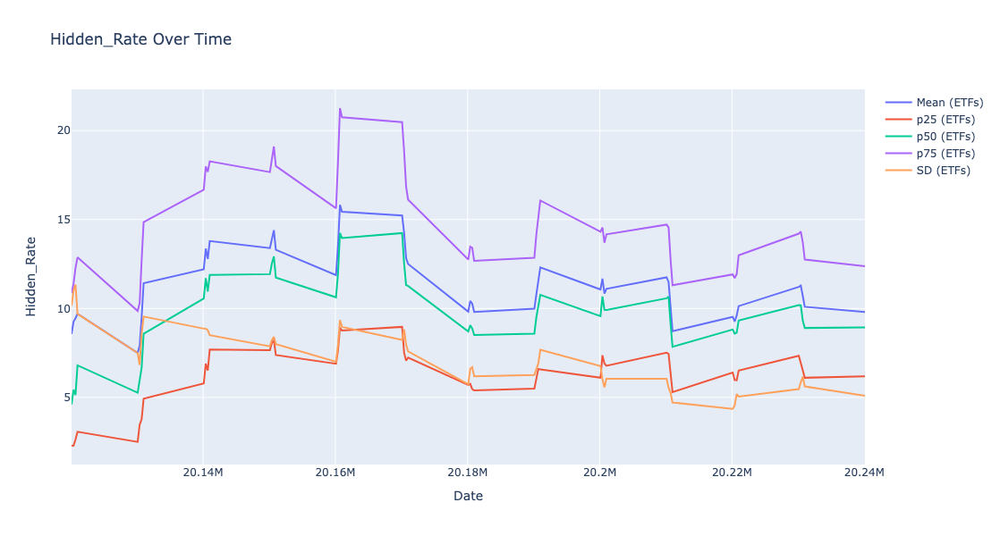

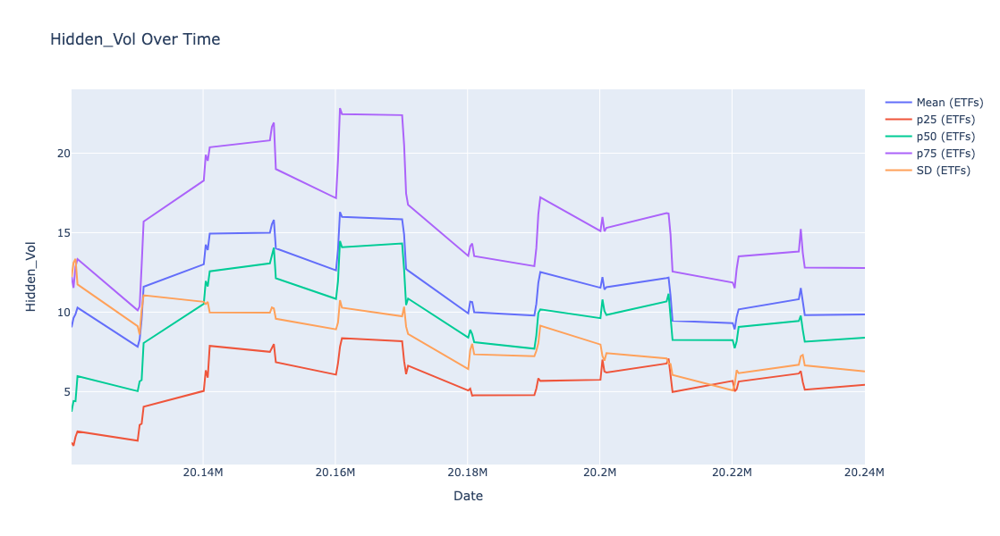

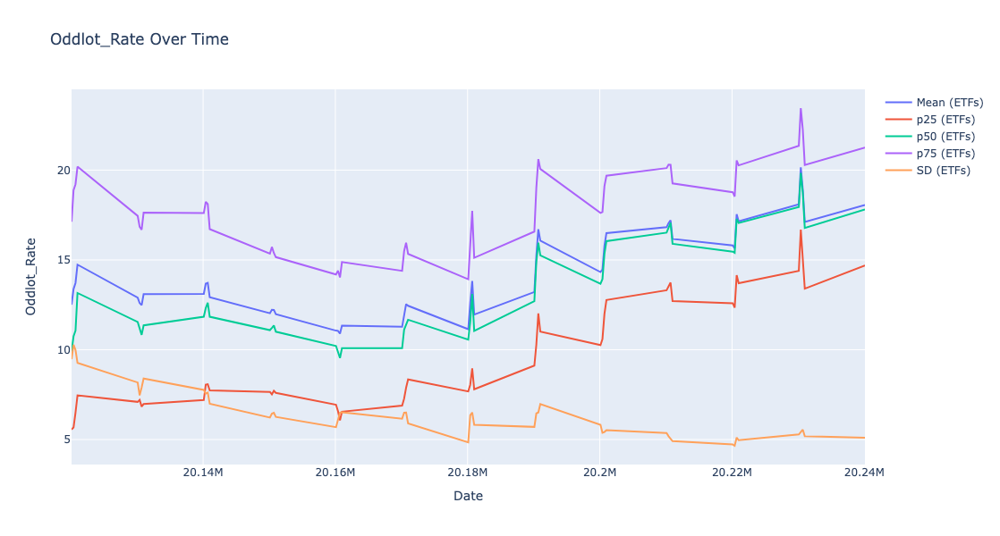

...

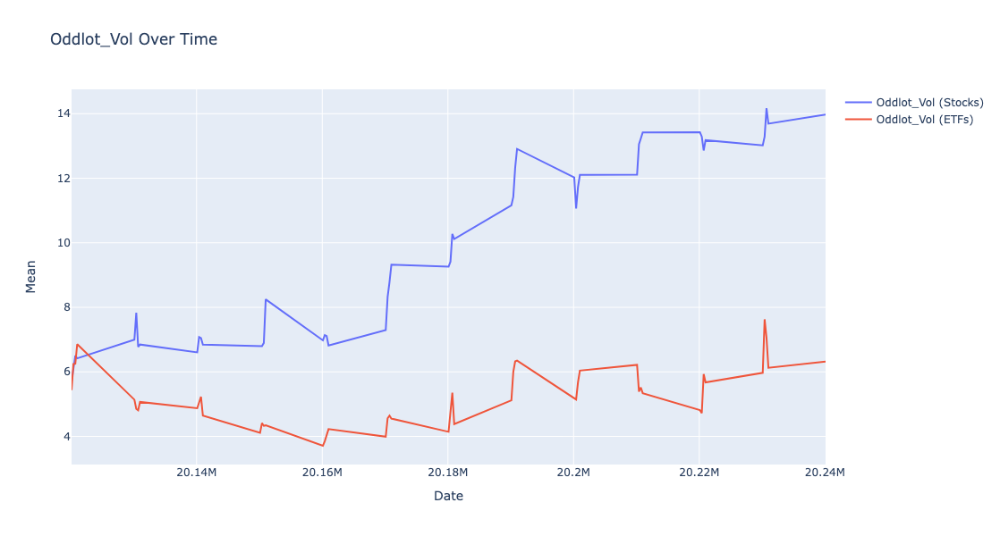

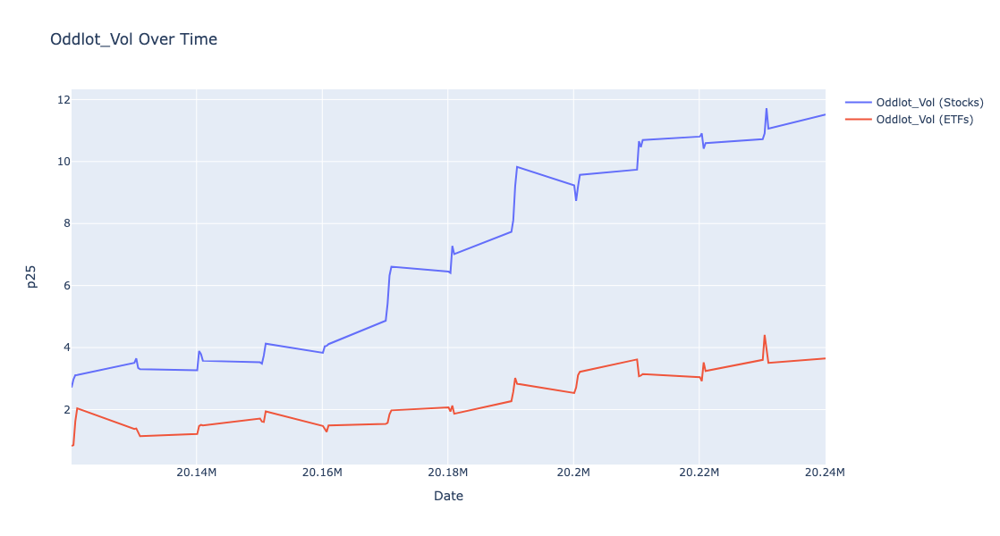

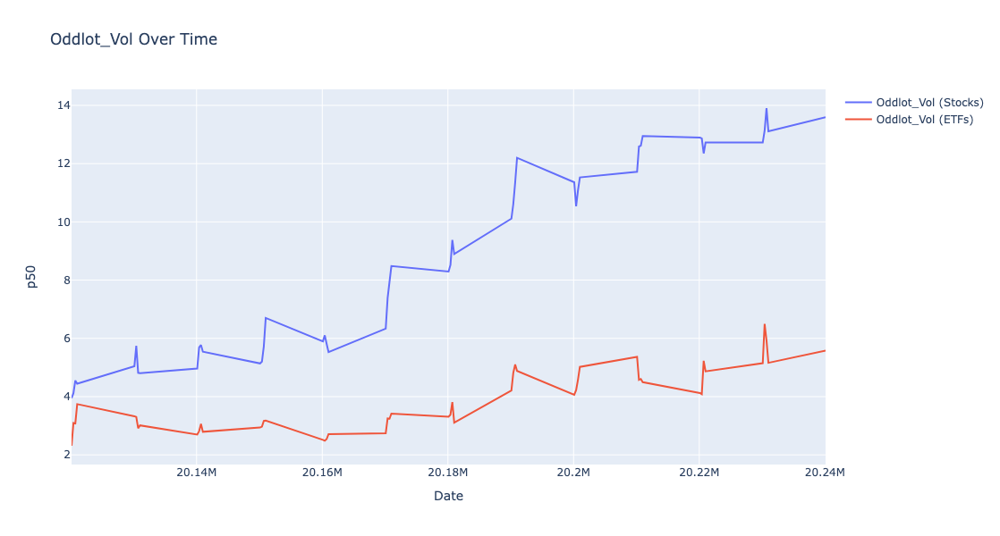

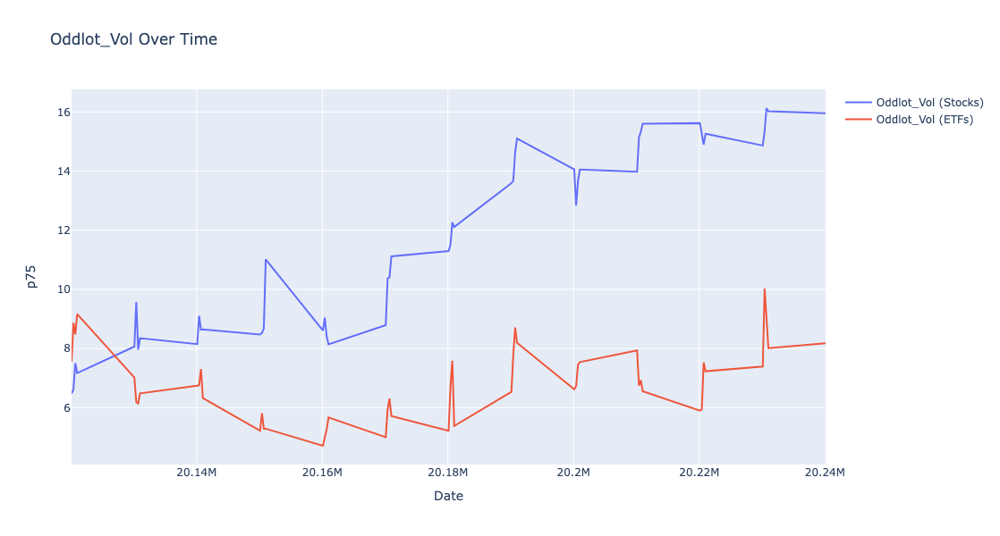

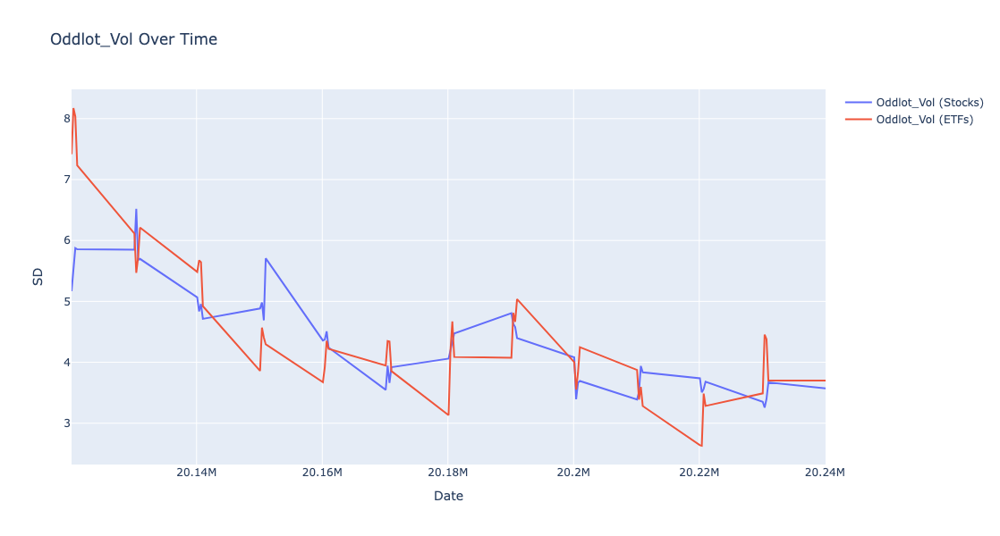

Document saved as Plots2.docx


In [6]:
plot(stocks,ETFs)

In [ ]:
a = get_stats(stocks,2012,2)
a